In [1]:
import numpy as np
import cupy as cp
import cupyx.scipy.signal as signal
import scipy
from scipy.optimize import curve_fit
import pandas as pd

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots

from astropy.modeling import models, fitting
import astropy.units as u
from astropy import constants as const
from astropy.stats import gaussian_sigma_to_fwhm,gaussian_fwhm_to_sigma

import datetime
import pickle
import importlib
import json
import time
import glob
from skimage.metrics import structural_similarity as ssim

from eve_ops.gaussian_fit_eve import gaussian_fit_eve
from eve_ops.data.eve_const import  wavelength_list_eve

## orginal 

before fitting

In [8]:
with open('./data/original_data.pkl', 'wb') as file:
    pickle.dump(original_df, file)

In [2]:
with open('eve_ops/data/original_data.pkl', 'rb') as file:
    original_df = pickle.load(file)
original_df

,time,irradiance
0,2010-04-30 00:00:00,"[2.6092563e-05, 0.00013120413, 0.00046210643, ..."
1,2010-04-30 00:00:10,"[2.4313835e-05, 0.00012673343, 0.00045906374, ..."
2,2010-04-30 00:00:20,"[2.5151077e-05, 0.00012693906, 0.00045360095, ..."
3,2010-04-30 00:00:30,"[2.5799252e-05, 0.00012680102, 0.0004512957, 0..."
4,2010-04-30 00:00:40,"[2.7351613e-05, 0.00012936983, 0.0004534847, 0..."
...,...,...
12996715,2014-12-31 22:59:19,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
12996716,2014-12-31 22:59:29,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
12996717,2014-12-31 22:59:39,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
12996718,2014-12-31 22:59:49,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."


In [6]:
# replace negative irradiance with np.nan
def replace_negative_one(x):
    # x[x<0]=np.nan
    x=np.where(x<0, np.nan, x)
    return x

original_df['irradiance'] = original_df['irradiance'].apply(replace_negative_one)

Text(0.5, 1.0, 'mean irradiance')

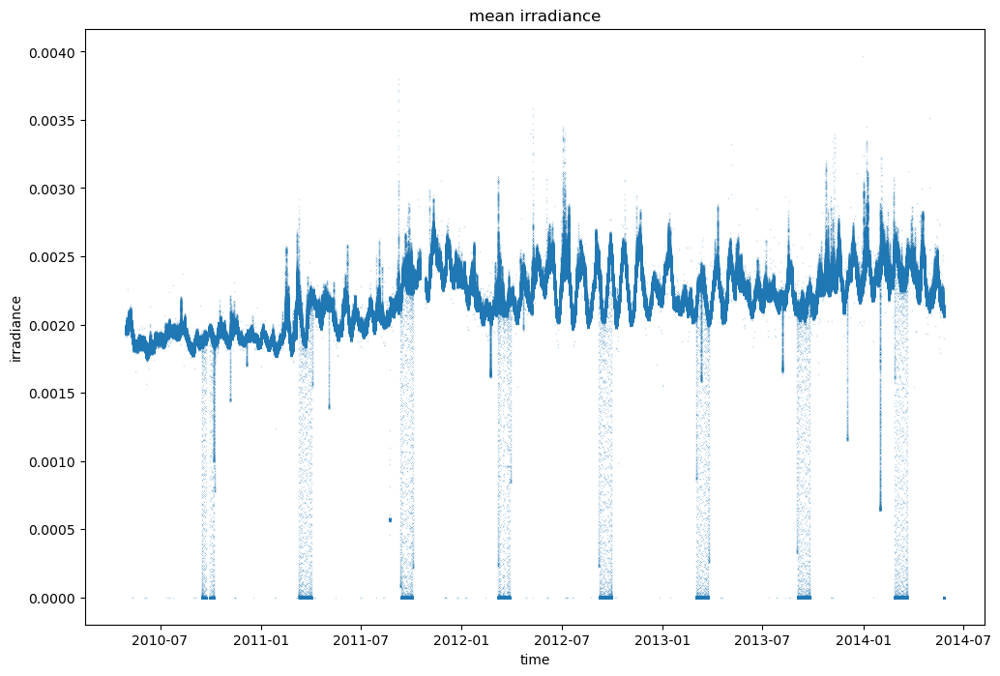

In [3]:
fig, ax = plt.subplots(figsize=(12, 8))

irradiance_mean=np.mean(np.stack(original_df['irradiance'].values),axis=1)

# markersize=0.1
ax.scatter(original_df['time'],irradiance_mean, s=0.003,marker='x')
ax.set_xlabel('time')
ax.set_ylabel('irradiance')
ax.set_title('mean irradiance')

# plt.savefig('./eve_fig/mean_irradiancex.png',
#             dpi=3000,
#             )

In [90]:
original_df['irradiance'].values

array([array([2.6092563e-05, 1.3120413e-04, 4.6210643e-04, 2.0390972e-03,
              4.6766386e-03, 6.5146396e-03, 5.6786640e-03, 3.1078281e-03,
              9.0871193e-04, 1.9184785e-04, 7.4447729e-05, 5.0256080e-05],
             dtype=float32)                                               ,
       array([2.4313835e-05, 1.2673343e-04, 4.5906374e-04, 2.0409019e-03,
              4.7102924e-03, 6.5212678e-03, 5.6551956e-03, 3.1033263e-03,
              9.1283396e-04, 1.9270962e-04, 7.4217343e-05, 5.2136638e-05],
             dtype=float32)                                               ,
       array([2.5151077e-05, 1.2693906e-04, 4.5360095e-04, 2.0149692e-03,
              4.6632029e-03, 6.4682844e-03, 5.6451596e-03, 3.0931851e-03,
              9.1073522e-04, 1.9306244e-04, 7.5396048e-05, 4.9857281e-05],
             dtype=float32)                                               ,
       ...,
       array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
             dty

In [4]:
original_df

,time,irradiance
0,2010-04-30 00:00:00,"[2.6092563e-05, 0.00013120413, 0.00046210643, ..."
1,2010-04-30 00:00:10,"[2.4313835e-05, 0.00012673343, 0.00045906374, ..."
2,2010-04-30 00:00:20,"[2.5151077e-05, 0.00012693906, 0.00045360095, ..."
3,2010-04-30 00:00:30,"[2.5799252e-05, 0.00012680102, 0.0004512957, 0..."
4,2010-04-30 00:00:40,"[2.7351613e-05, 0.00012936983, 0.0004534847, 0..."
...,...,...
12996715,2014-12-31 22:59:19,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
12996716,2014-12-31 22:59:29,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
12996717,2014-12-31 22:59:39,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
12996718,2014-12-31 22:59:49,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."


### 自动插值
疑问？？

In [22]:
original_df['time']<pd.to_datetime('2014-05-26 00:00:00')

0            True
1            True
2            True
3            True
4            True
            ...  
12996715    False
12996716    False
12996717    False
12996718    False
12996719    False
Name: time, Length: 12996720, dtype: bool

In [23]:
original_df[original_df['time']<pd.to_datetime('2014-05-26 00:00:00')]

,time,irradiance
0,2010-04-30 00:00:00,"[2.6092563e-05, 0.00013120413, 0.00046210643, ..."
1,2010-04-30 00:00:10,"[2.4313835e-05, 0.00012673343, 0.00045906374, ..."
2,2010-04-30 00:00:20,"[2.5151077e-05, 0.00012693906, 0.00045360095, ..."
3,2010-04-30 00:00:30,"[2.5799252e-05, 0.00012680102, 0.0004512957, 0..."
4,2010-04-30 00:00:40,"[2.7351613e-05, 0.00012936983, 0.0004534847, 0..."
...,...,...
12679195,2014-05-25 23:59:19,"[4.6894696e-05, 0.00021434555, 0.0008643167, 0..."
12679196,2014-05-25 23:59:29,"[4.0134677e-05, 0.0002101546, 0.00085772586, 0..."
12679197,2014-05-25 23:59:39,"[5.1819312e-05, 0.00022556532, 0.0008709644, 0..."
12679198,2014-05-25 23:59:49,"[4.494446e-05, 0.00021898717, 0.0008798296, 0...."


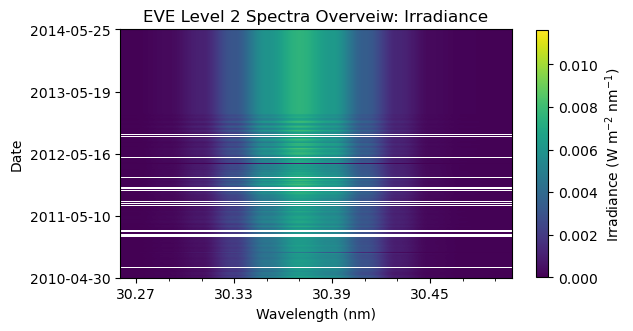

In [4]:
fig,ax=plt.subplots()
# sc=ax.imshow(np.stack(original_df['irradiance'].values),aspect=6e-7,origin='lower'
#             # , interpolation='none'
#             )


sc=ax.imshow(np.stack((original_df[original_df['time']<pd.to_datetime('2014-05-26 00:00:00')]['irradiance']).values),
             aspect=6e-7,origin='lower'
            # , interpolation='none'
            )
# add a title to the colorbar: Irradiance (W m$^{-2}$ nm$^{-1}$)
cbar = fig.colorbar(sc,shrink=0.55)
cbar.set_label('Irradiance (W m$^{-2}$ nm$^{-1}$)')


# set x tick label using wavelength_list_eve
ax.set_xticks(np.arange(0,len(wavelength_list_eve),3))
ax.set_xticklabels(wavelength_list_eve[::3])

# set y tick label using date in time, set 5 ticks in total
# ax.set_yticks(np.linspace(0,len(original_df)-1,5))
ax.set_yticks(np.linspace(0,12679199,5))
# ax.set_yticklabels([original_df['time'][i].date() for i in np.linspace(0,len(original_df)-1,5).astype(int)])
ax.set_yticklabels([original_df['time'][i].date() for i in np.linspace(0,12679199,5).astype(int)])

ax.set_xlabel('Wavelength (nm)')
ax.set_ylabel('Date')
ax.set_title('EVE Level 2 Spectra Overveiw: Irradiance')
# add minor and major tick of x axis
ax.xaxis.set_major_locator(plt.MultipleLocator(3))
ax.xaxis.set_minor_locator(plt.MultipleLocator(1))

plt.tight_layout()
plt.savefig('eve_ops\eve_fig\eps\overview_irradiance.pdf')

## 10s

In [6]:
time_list = original_df.index.tolist()

In [3]:
original_df.iloc[0]['irradiance']

array([2.6092563e-05, 1.3120413e-04, 4.6210643e-04, 2.0390972e-03,
       4.6766386e-03, 6.5146396e-03, 5.6786640e-03, 3.1078281e-03,
       9.0871193e-04, 1.9184785e-04, 7.4447729e-05, 5.0256080e-05],
      dtype=float32)

### fit

In [3]:
mean_list=[]
stddev_list=[]
amp_list=[]
pcov_list=[]
time_list=[]

i=0
for key in list(original_df.index)[:]:
    #popt: fit value
    # pcov: stddev of the fit
    popt,pcov=gaussian_fit_eve(wavelength_list_eve,original_df.iloc[key]['irradiance'])
    amplitude, mean, stddev=popt
    time=original_df.iloc[key]['time']


    amp_list.append(amplitude)
    mean_list.append(mean)
    stddev_list.append(stddev)

    pcov_list.append(pcov)
    time_list.append(time)

    # if not np.isnan(cen):
    # print(key,cen)


    i=i+1
    if(i%86400==0):
        print(key,mean)


fit_df={    'time':time_list,
           'amplitude':amp_list,
           'mean':mean_list,
           'stddev':stddev_list,
           'pcov':pcov_list,
           
            }
            
fit_df=pd.DataFrame(fit_df)

with open('./data/fit_df.pkl', 'wb') as file:
    pickle.dump(fit_df, file)

86399 30.374267882286016
172799 30.37266078342511
259199 30.372712101560154
345599 30.374629693870528
431999 30.37409532480058
518399 30.373941752961947
604799 30.374138239983765
691199 30.374229746684755
777599 [nan]
863999 30.373659503022235
950399 30.374064867988753
1036799 30.374128923236746
1123199 30.373900351690565


c:\Users\14902\anaconda3\envs\sdo2022\lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


1209599 30.374505201824817
1295999 30.374870697253012
1382399 30.374192828227056
1468799 30.373938255145767
1555199 30.37454533507014
1641599 30.37352446065396
1727999 30.373810265948652
1814399 30.373733983870682
1900799 30.373655085067607
1987199 30.373991148063407
2073599 30.37365576835379
2159999 30.373622680362903
2246399 30.37403964278921
2332799 30.37383691583676
2419199 30.373346592292762
2505599 30.37413988251278
2591999 30.372976006597728
2678399 30.373973335955554
2764799 30.37463489549162
2851199 30.372869028645912
2937599 30.372973179146232
3023999 30.373050457011846
3110399 30.37276418674677
3196799 30.37327288805736
3283199 30.37326526545869
3369599 30.372701395146358
3455999 30.37322515174669
3542399 30.372168784748943
3628799 30.372399974810854
3715199 30.37259251614372
3801599 30.37249549740967
3887999 30.37225045757602
3974399 30.372951117487055
4060799 30.37251281116414
4147199 30.37273385469854
4233599 30.37322616331378
4319999 30.372925224788997
4406399 30.3729167

In [ ]:
np.sum(fit_df['stddev'].values<0)/np.size(fit_df['stddev'].values)   #  =0.14426
#indicates that the fit of stddev is negative for 14.4% of the data, a little weird, but not a big deal
# I just set the negative stddev to the absolute value
fit_df['stddev'] = fit_df['stddev'].abs()

In [18]:
with open('./data/fit_df.pkl', 'wb') as file:
    pickle.dump(fit_df, file)

#### save & read

In [6]:
with open('eve_ops/data/fit_df.pkl', 'rb') as file:
    fit_df=pickle.load(file)
fit_df.set_index('time',inplace=True)

In [34]:
fit_df.iloc[0][['amplitude','mean','stddev']]

amplitude     0.006621
mean         30.374182
stddev        0.028687
Name: 2010-04-30 00:00:00, dtype: object

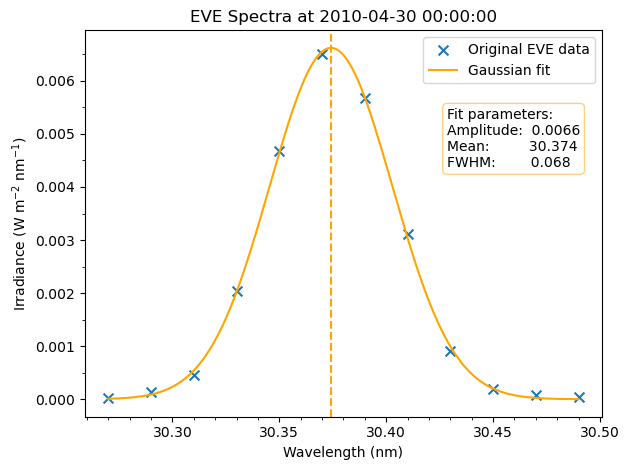

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [9]:
def gaussian_function(x, amplitude, mean, stddev):
    # A refers to Amplitude, the peak value!   not the integrated area!
    return amplitude * np.exp(-(x - mean)**2 / (2 * stddev**2))


fig, ax = plt.subplots()
plt.scatter(wavelength_list_eve, original_df.iloc[0]['irradiance'],
            marker='x', label='Original EVE data', s=50)

denser_x = np.linspace(wavelength_list_eve[0], wavelength_list_eve[-1], 1000)
plt.plot(denser_x, gaussian_function(denser_x, *fit_df.iloc[0][['amplitude', 'mean', 'stddev']]),
         color='orange', label='Gaussian fit')

# Draw a vertical line at the mean of the fit
plt.axvline(fit_df.iloc[0]['mean'], color='orange', linestyle='--')

ax.set_xlabel('Wavelength (nm)')
ax.set_ylabel('Irradiance (W m$^{-2}$ nm$^{-1}$)')
ax.set_title('EVE Spectra at 2010-04-30 00:00:00')



# Format and place the Gaussian fit parameters inside the figure, aligned left
param_text = ('Fit parameters:\n'
              f'Amplitude:  {fit_df.iloc[0]["amplitude"]:.4f}\n'
              f'Mean:         {fit_df.iloc[0]["mean"]:.3f}\n'
              f'FWHM:        {fit_df.iloc[0]["stddev"]*gaussian_sigma_to_fwhm:.3f}')
              
# Choose the position for your text box
text_x_pos = 0.70  # x position, 5% from the left edge of the axes
text_y_pos = 0.80  # y position, 95% from the bottom edge of the axes

ax.text(text_x_pos, text_y_pos, param_text,
        horizontalalignment='left',
        verticalalignment='top',
        transform=ax.transAxes,
        fontsize=10,  # Choose a font size that fits well in the corner
        bbox=dict(boxstyle="round,pad=0.3", edgecolor='orange', facecolor='white', alpha=0.5))




# Add minor and major ticks
ax.xaxis.set_minor_locator(plt.MultipleLocator(0.01))
ax.xaxis.set_major_locator(plt.MultipleLocator(0.05))
ax.yaxis.set_minor_locator(plt.MultipleLocator(0.0005))
ax.yaxis.set_major_locator(plt.MultipleLocator(0.001))

plt.tight_layout()
ax.legend()
plt.show()
fig.savefig("eve_ops\eve_fig\eps\gaussian_fit_example.eps")

In [28]:
original_df.iloc[0]
fit_df.iloc[0]

amplitude                                             0.006621
mean                                                 30.374182
stddev                                                0.028687
pcov         [[1.909934104783326e-09, 9.230200868174452e-14...
Name: 2010-04-30 00:00:00, dtype: object

### fit check

In [117]:
#pcov: stddev of the fit
para_err=fit_df.apply(lambda x: np.sqrt(np.diag(x['pcov'])),axis=1)

para=fit_df[['amplitude','mean','stddev']].apply(lambda row: np.array(row), axis=1)

# create a df with para,para_err,time
para_df=pd.DataFrame({'para':para,'para_err':para_err,'time':fit_df['time']})
para_df

,para,para_err,time
0,"[0.0066209679758718635, 30.374181533230832, 0....","[4.370279287166126e-05, 0.00021864631109890078...",2010-04-30 00:00:00
1,"[0.006622531842682174, 30.374067856544013, 0.0...","[4.521320733346212e-05, 0.00022628130573675088...",2010-04-30 00:00:10
2,"[0.006581290750024666, 30.37419578970366, 0.02...","[4.4619822251269725e-05, 0.0002246421890415008...",2010-04-30 00:00:20
3,"[0.006522127004488277, 30.37419908429497, 0.02...","[4.760003880060405e-05, 0.00024276634518606755...",2010-04-30 00:00:30
4,"[0.006493335825966912, 30.374290896610958, 0.0...","[4.503000590552226e-05, 0.00023070871117740789...",2010-04-30 00:00:40
...,...,...,...
12996715,"[nan, nan, nan]","[nan, nan, nan]",2014-12-31 22:59:19
12996716,"[nan, nan, nan]","[nan, nan, nan]",2014-12-31 22:59:29
12996717,"[nan, nan, nan]","[nan, nan, nan]",2014-12-31 22:59:39
12996718,"[nan, nan, nan]","[nan, nan, nan]",2014-12-31 22:59:49


In [118]:
with open('./data/para_df.pkl', 'wb') as file:
    pickle.dump(para_df, file)

In [8]:
with open('eve_ops/data/para_df.pkl', 'rb') as file:
    para_df=pickle.load(file)

In [42]:
gaussian_sigma_to_fwhm

2.3548200450309493

In [69]:
temp['time'].iloc[-1]

Timestamp('2014-05-25 23:59:59')

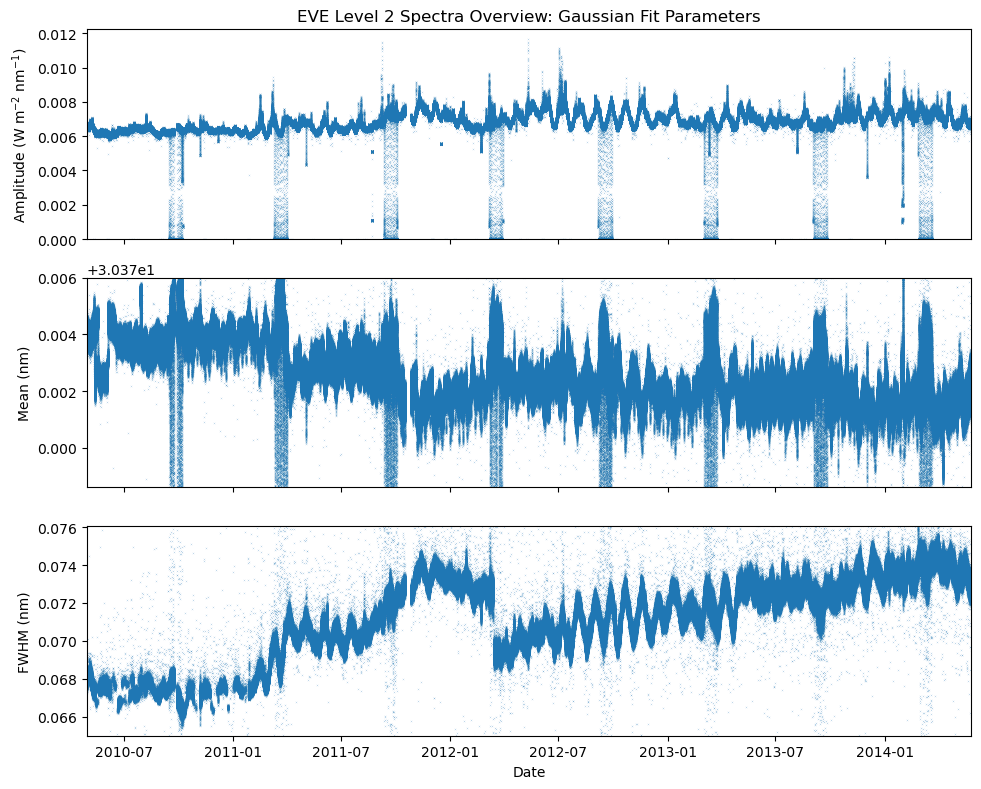

In [11]:
# 3 row 1 column    不能用plotly画因为点太多了 只能用matplotlib
temp=para_df[para_df['time']<pd.to_datetime('2014-05-26 00:00:00')]

fig,axs=plt.subplots(3,1,
                     figsize=(10,8),
                     sharex=True,)


axs[0].scatter(temp['time'],np.stack(temp['para'].values)[:, 0],s=0.003,marker='x',label='amplitude')
# axs[0].scatter(para_df['time'],np.stack(para_df['para_err'].values)[:, 0],s=0.003,marker='x',label='amplitude_err')
axs[0].set_ylabel('Amplitude (W m$^{-2}$ nm$^{-1}$)')
axs[0].set_ylim(0.,)

axs[1].scatter(temp['time'],np.stack(temp['para'].values)[:, 1],s=0.003,marker='x',label='mean')
# axs[1].scatter(para_df['time'],np.stack(para_df['para_err'].values)[:, 1],s=0.003,marker='x',label='mean_err')
axs[1].set_ylabel('Mean (nm)')
axs[1].set_ylim(30.3686,30.376)

axs[2].scatter(temp['time'],gaussian_sigma_to_fwhm*np.stack(temp['para'].values)[:, 2],s=0.003,marker='x',label='stddev')
# axs[2].scatter(para_df['time'],np.stack(para_df['para_err'].values)[:, 2],s=0.003,marker='x',label='stddev_err')
axs[2].set_ylabel('FWHM (nm)')
axs[2].set_ylim(0.0276*gaussian_sigma_to_fwhm,0.0323*gaussian_sigma_to_fwhm)
axs[2].set_xlabel('Date')
axs[2].set_xlim(temp['time'].iloc[0],temp['time'].iloc[-1])

axs[0].set_title('EVE Level 2 Spectra Overview: Gaussian Fit Parameters')


    
plt.tight_layout()
fig.savefig('eve_ops/eve_fig/eps/para_overview_low_res.png',
            # dpi=400
            )

In [12]:
np.stack(para_df['para_err'].values)

array([[4.37027929e-05, 2.18646311e-04, 2.18646449e-04],
       [4.52132073e-05, 2.26281306e-04, 2.26281450e-04],
       [4.46198223e-05, 2.24642189e-04, 2.24642335e-04],
       ...,
       [           nan,            nan,            nan],
       [           nan,            nan,            nan],
       [           nan,            nan,            nan]])

In [18]:
np.stack(para_df['para_err'].values)/np.stack(para_df['para'].values)

array([[6.60066519e-03, 7.19842643e-06, 7.62179876e-03],
       [6.82717855e-03, 7.44981893e-06, 7.88335475e-03],
       [6.77979806e-03, 7.39582344e-06, 7.82864239e-03],
       ...,
       [           nan,            nan,            nan],
       [           nan,            nan,            nan],
       [           nan,            nan,            nan]])

In [24]:
{100*np.nanmedian((np.stack(para_df['para_err'].values)/np.stack(para_df['para'].values))[:,0])}

{0.3556994185439119}

In [30]:
a=100*np.nanmedian((np.stack(para_df['para_err'].values)/np.stack(para_df['para'].values))[:,0])
print('amplitude fit error:'+
    f'{a:.2}%'
     )

a=100*np.nanmedian((np.stack(para_df['para_err'].values)/np.stack(para_df['para'].values))[:,1])
print('mean fit error:'+
    f'{a:.2}%'
     )

a=100*np.nanmedian((np.stack(para_df['para_err'].values)/np.stack(para_df['para'].values))[:,2])
print('stddev fit error:'+
    f'{a:.2}%'
     )

amplitude fit error:0.36%
mean fit error:0.00041%
stddev fit error:0.39%


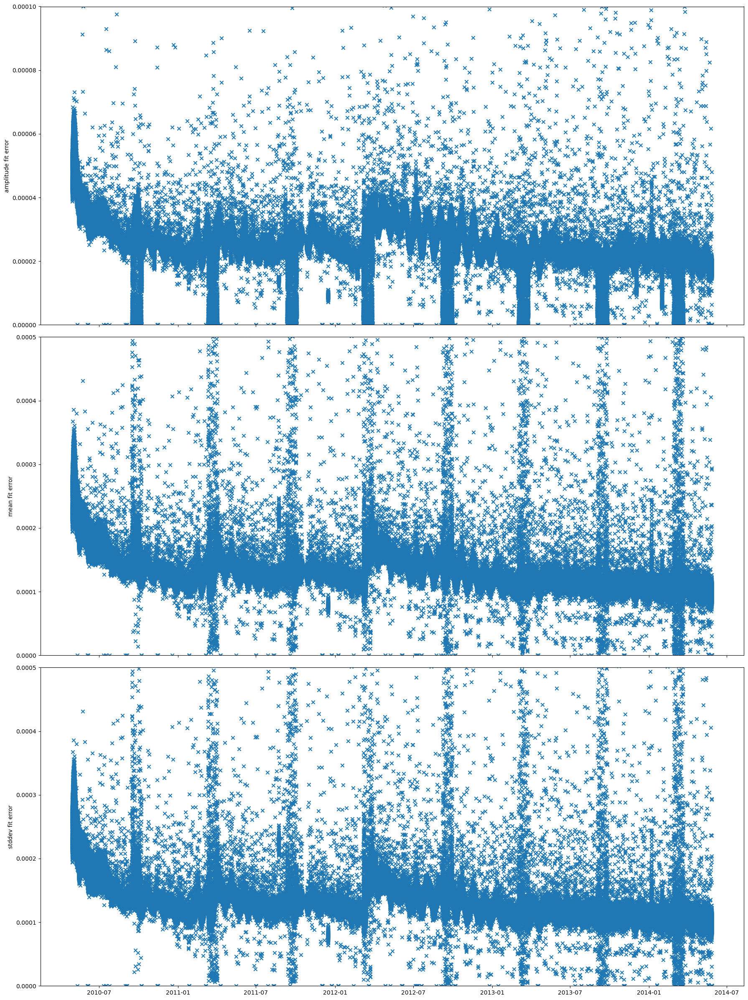

In [32]:
# 3 row 1 column
fig,axs=plt.subplots(3,1,figsize=(18,24),sharex=True,)
# axs[0].scatter(para_df['time'],np.stack(para_df['para'].values)[:, 0],marker='x',label='amplitude')
axs[0].scatter(para_df['time'],np.stack(para_df['para_err'].values)[:, 0],marker='x',label='amplitude_err')
axs[0].set_ylabel('amplitude fit error')
axs[0].set_ylim(0,1e-4)

# axs[1].scatter(para_df['time'],np.stack(para_df['para'].values)[:, 1],marker='x',label='mean')
axs[1].scatter(para_df['time'],np.stack(para_df['para_err'].values)[:, 1],marker='x',label='mean_err')
axs[1].set_ylabel('mean fit error')
axs[1].set_ylim(0,5e-4)


# axs[2].scatter(para_df['time'],np.stack(para_df['para'].values)[:, 2],marker='x',label='stddev')
axs[2].scatter(para_df['time'],np.stack(para_df['para_err'].values)[:, 2],marker='x',label='stddev_err')
axs[2].set_ylabel('stddev fit error')
axs[2].set_ylim(0,5e-4)

plt.tight_layout()
plt.savefig('./eve_fig/fit_err.png',
            # dpi=3000,
            )

In [33]:
a,b=np.where(np.isnan(np.stack(para_df['para'].values)))

In [1]:
a[:20]

NameError: name 'a' is not defined

In [5]:
fit_df.set_index('time',inplace=True)

In [12]:
fit_df

,amplitude,mean,stddev,pcov
time,,,,
2010-04-30 00:00:00,0.006621,30.374182,0.028687,"[[1.909934104783326e-09, 9.230200868174452e-14..."
2010-04-30 00:00:10,0.006623,30.374068,0.028704,"[[2.044234117378633e-09, 9.873151283360399e-14..."
2010-04-30 00:00:20,0.006581,30.374196,0.028695,"[[1.990928537734905e-09, 9.676613666554314e-14..."
2010-04-30 00:00:30,0.006522,30.374199,0.028807,"[[2.2657636938190113e-09, 1.1100608871630828e-..."
2010-04-30 00:00:40,0.006493,30.374291,0.028811,"[[2.02770143185137e-09, 9.9755436572809e-14, -..."
...,...,...,...,...
2014-12-31 22:59:19,NaN,NaN,NaN,"[[nan, nan, nan], [nan, nan, nan], [nan, nan, ..."
2014-12-31 22:59:29,NaN,NaN,NaN,"[[nan, nan, nan], [nan, nan, nan], [nan, nan, ..."
2014-12-31 22:59:39,NaN,NaN,NaN,"[[nan, nan, nan], [nan, nan, nan], [nan, nan, ..."


In [26]:
np.sum(fit_df['stddev'].values<0)

1874976

In [23]:
# select the df in a given time range, the index of the df is the time
t0=pd.to_datetime('2011-01-01 00:00:00')
t1=pd.to_datetime('2012-01-03 00:02:00')

df=fit_df[(fit_df.index>=t0)&(fit_df.index<t1)]
df


,amplitude,mean,stddev,pcov
time,,,,
2011-01-01 00:00:00,0.006386,30.374297,-0.028465,"[[5.155003292139789e-10, 2.5924005146691206e-1..."
2011-01-01 00:00:10,0.006347,30.374354,-0.028582,"[[5.165587297708697e-10, 2.6069930669568e-14, ..."
2011-01-01 00:00:20,0.006359,30.374396,-0.028579,"[[5.383820470075147e-10, 2.7112479395637946e-1..."
2011-01-01 00:00:30,0.006362,30.374367,-0.028494,"[[4.796323953209498e-10, 2.4197928865454195e-1..."
2011-01-01 00:00:40,0.006379,30.374434,-0.028535,"[[4.956469147129526e-10, 2.491616984615549e-14..."
...,...,...,...,...
2012-01-03 00:01:15,0.007044,30.371646,0.031150,"[[5.825908721030129e-10, 4.07177625547721e-14,..."
2012-01-03 00:01:25,0.007007,30.371767,0.031143,"[[6.184230585909259e-10, 4.289503880029078e-14..."
2012-01-03 00:01:35,0.007066,30.371623,0.031012,"[[5.82214653870999e-10, 3.8872682024646545e-14..."


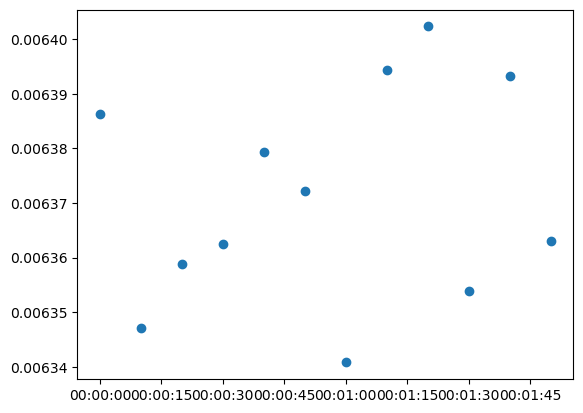

In [12]:
plt.scatter(df.index,df['amplitude'])

In [21]:
def plot_eve(t0,t1,fit_df):
    df=fit_df[(fit_df.index>=t0)&(fit_df.index<t1)]
    
    fig,axs=plt.subplots(3,1,figsize=(18,24),sharex=True,)

    axs[0].scatter(df.index,df['amplitude'],marker='x',label='amplitude')
    axs[0].set_ylabel('amplitude')
    # axs[0].set_ylim(0,1e-4)

    axs[1].scatter(df.index,df['mean'],marker='x',label='mean')
    axs[1].set_ylabel('mean')
    # axs[1].set_ylim(0,5e-4)


    # axs[2].scatter(para_df['time'],np.stack(para_df['para'].values)[:, 2],marker='x',label='stddev')
    axs[2].scatter(df.index,np.abs(df['stddev']),marker='x',label='stddev')
    axs[2].set_ylabel('stddev')
    # axs[2].set_ylim(0,5e-4)

    plt.tight_layout()
    

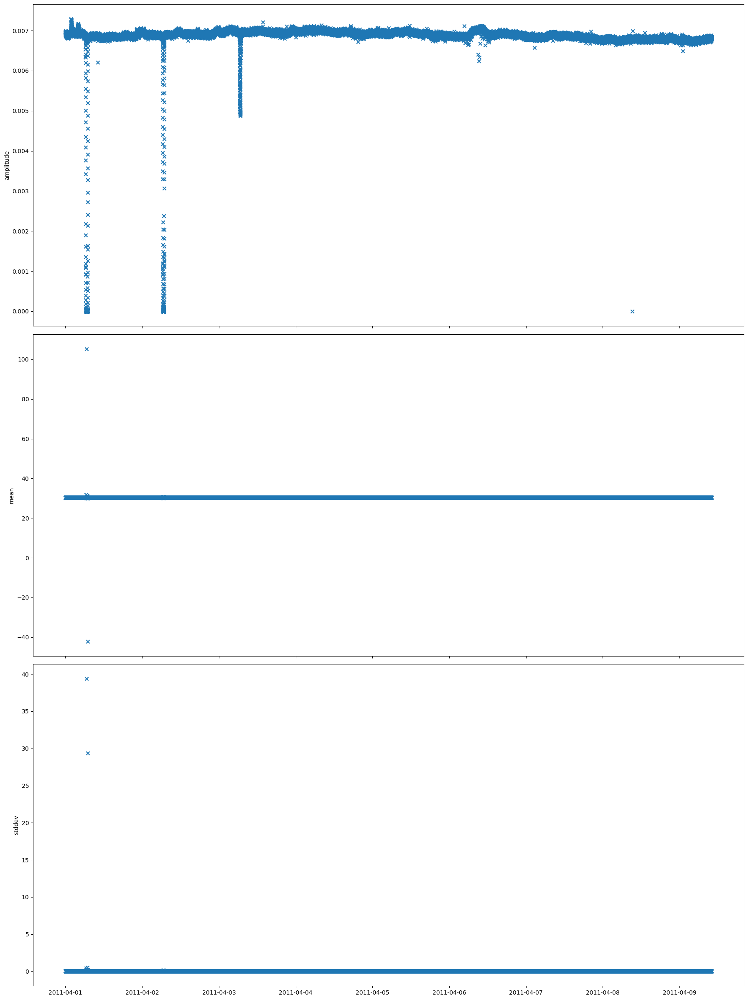

In [35]:
t0=pd.to_datetime('2011-04-01 00:00:00')
t1=pd.to_datetime('2011-04-09 10:00:00')
plot_eve(t0,t1,fit_df)

## day

In [11]:
fit_df.set_index('time',inplace=True)

KeyError: "None of ['time'] are in the columns"

In [12]:
def f(x):
    y=np.size(x)-np.sum(np.isnan(x))
    return y

stddev_of_mean=fit_df['mean'].resample('D').agg(np.nanstd)
stddev_of_stddev=fit_df['stddev'].resample('D').agg(np.nanstd)
stddev_of_amplitude=fit_df['amplitude'].resample('D').agg(np.nanstd)
available_data=fit_df['amplitude'].resample('D').agg(f)

In [13]:
columns_to_agg = ['amplitude', 'mean', 'stddev']
daily_median = fit_df[columns_to_agg].resample('D').agg(np.nanmedian)

# Create a new DataFrame 'daily_fit_df' to store the daily median, stddev, and amplitude
# fwhm=2.3*stddev
daily_df = pd.DataFrame()
daily_df['median_of_mean'] = daily_median['mean']
daily_df['median_of_stddev'] = daily_median['stddev']
daily_df['median_of_amplitude'] = daily_median['amplitude']

daily_df['stddev_of_mean']=stddev_of_mean
daily_df['stddev_of_stddev']=stddev_of_stddev
daily_df['stddev_of_amplitude']=stddev_of_amplitude

daily_df['available_data']=available_data

# Print the new DataFrame
daily_df

,median_of_mean,median_of_stddev,median_of_amplitude,stddev_of_mean,stddev_of_stddev,stddev_of_amplitude,available_data
time,,,,,,,
2010-04-30,30.374138,0.028910,0.006518,0.000175,0.000076,0.000058,8570
2010-05-01,30.374133,0.028986,0.006556,0.000199,0.000070,0.000052,8579
2010-05-02,30.374000,0.029030,0.006503,0.000210,0.000070,0.000048,8579
2010-05-03,30.373922,0.029038,0.006513,0.000206,0.000102,0.000049,8640
2010-05-04,30.373876,0.029006,0.006656,0.000195,0.000092,0.000059,8578
...,...,...,...,...,...,...,...
2014-12-27,NaN,NaN,NaN,NaN,NaN,NaN,0
2014-12-28,NaN,NaN,NaN,NaN,NaN,NaN,0
2014-12-29,NaN,NaN,NaN,NaN,NaN,NaN,0


In [14]:
with open('./data/daily_df.pkl', 'wb') as file:
    pickle.dump(daily_df, file)

#### save & read

In [2]:
with open('D:\py_repo\EVE-spectrum-correction\Chapter4_v2\\basic_ops\eve_ops\data\daily_df.pkl', 'rb') as file:
    daily_df=pickle.load(file)

In [3]:
daily_df

,median_of_mean,median_of_stddev,median_of_amplitude,stddev_of_mean,stddev_of_stddev,stddev_of_amplitude,available_data
time,,,,,,,
2010-04-30,30.374138,0.028910,0.006518,0.000175,0.000076,0.000058,8570
2010-05-01,30.374133,0.028986,0.006556,0.000199,0.000070,0.000052,8579
2010-05-02,30.374000,0.029030,0.006503,0.000210,0.000070,0.000048,8579
2010-05-03,30.373922,0.029038,0.006513,0.000206,0.000102,0.000049,8640
2010-05-04,30.373876,0.029006,0.006656,0.000195,0.000092,0.000059,8578
...,...,...,...,...,...,...,...
2014-12-27,NaN,NaN,NaN,NaN,NaN,NaN,0
2014-12-28,NaN,NaN,NaN,NaN,NaN,NaN,0
2014-12-29,NaN,NaN,NaN,NaN,NaN,NaN,0


In [72]:
amplitude=daily_df['median_of_amplitude'].values
mean=daily_df['median_of_mean'].values
stddev=daily_df['median_of_stddev'].values

def get_abs_diff_matrix(a):
    a=np.array(a)
    b=np.abs(a-a[:,np.newaxis])
    return b
    
amplitude_diff_matrix=get_abs_diff_matrix(amplitude)
mean_diff_matrix=get_abs_diff_matrix(mean)
stddev_diff_matrix=get_abs_diff_matrix(stddev)

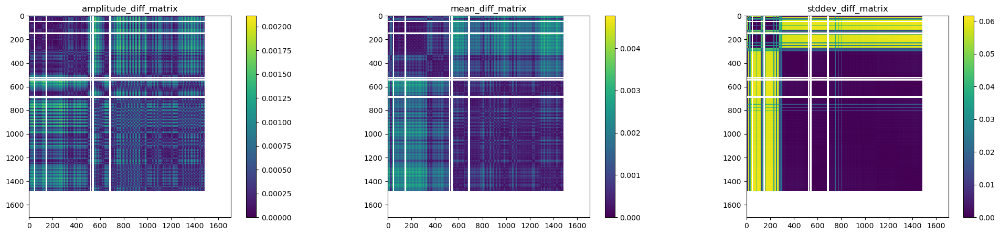

In [75]:
#imshow amplitude_diff_matrix, mean_diff_matrix, stddev_diff_matrix
fig,ax=plt.subplots(1,3,figsize=(25,5))
sc=ax[0].imshow(amplitude_diff_matrix)
ax[0].set_title('amplitude_diff_matrix')
fig.colorbar(sc,ax=ax[0])

sc=ax[1].imshow(mean_diff_matrix)
ax[1].set_title('mean_diff_matrix')
fig.colorbar(sc,ax=ax[1])

sc=ax[2].imshow(stddev_diff_matrix)
ax[2].set_title('stddev_diff_matrix')
fig.colorbar(sc,ax=ax[2])

plt.savefig('./data/fit_diff_matrix.png')

In [18]:
daily_fit_df=daily_df

In [4]:
def plot(eve_df,aia_df):
    fig = make_subplots(rows=4, cols=1, shared_xaxes=True, vertical_spacing=.011)

    valid_day=np.where(eve_df['available_data']>=np.nanmean(eve_df['available_data'])*0.2,1,np.nan)
    x = eve_df.index
    y_median = eve_df['median_of_mean']*valid_day
    y_stddev = eve_df['stddev_of_mean']
    fill_x = np.concatenate([x, x[::-1]])
    fill_y = np.concatenate([y_median + 3 * y_stddev, (y_median - 3 * y_stddev)[::-1]])

    # Plot the mean line
    fig.add_trace(go.Scatter(x=x, y=y_median,
                                 showlegend=False, 
                           line=dict(color='rgb(0,128,255)', )) ,
               row=1, col=1,)
    # Plot the shaded area between mean + 3 std deviations and mean - 3 std deviations
    fig.add_trace(go.Scatter(x=fill_x, y=fill_y, mode='lines', 
                                 fill='tozerox', 
                                 fillcolor='rgba(0,176,246,0.2)',
                                 line=dict(color='rgba(127,255,0,0.2)'),
                                 showlegend=False, 
                                 name='3 Std. Dev.'),
               row=1, col=1)

    fig.update_yaxes(title_text="Mean (nm)",range=[30.3705, 30.3755],row=1, col=1)
    # Show the plot



    # Create a figure for fwhm
    x = eve_df.index
    y_median = eve_df['median_of_stddev']*valid_day
    y_stddev = eve_df['stddev_of_stddev']
    fill_x = np.concatenate([x, x[::-1]])
    fill_y = np.concatenate([y_median + 3 * y_stddev, (y_median - 3 * y_stddev)[::-1]])

    fig.add_trace(go.Scatter(x=x, y=y_median,
                              showlegend=False,
                           line=dict(color='rgb(0,128,255)'),),
                        row=2, col=1)
    # Plot the shaded area between mean + 3 std deviations and mean - 3 std deviations
    fig.add_trace(go.Scatter(x=fill_x, y=fill_y, mode='lines', 
                                 fill='tozerox', 
                                 fillcolor='rgba(0,176,246,0.2)',
                                 line=dict(color='rgba(127,255,0,0.2)'),
                                 showlegend=False,
                                 name='3 Std. Dev.'),
                     row=2, col=1)

    fig.update_yaxes(title_text="Stddev (nm)",
                  range=[0.065, 0.076],
                  row=2, col=1)





    # # Create a figure for amplitude
    x = eve_df.index
    y_median = eve_df['median_of_amplitude']*valid_day
    y_stddev = eve_df['stddev_of_amplitude']
    fill_x = np.concatenate([x, x[::-1]])
    fill_y = np.concatenate([y_median + 3 * y_stddev, (y_median - 3 * y_stddev)[::-1]])


    fig.add_trace(go.Scatter(x=eve_df.index, y=y_median,
                                          showlegend=False,
                           line=dict(color='rgb(0,128,255)'),),
                           row=3, col=1)
    # Plot the shaded area between mean + 3 std deviations and mean - 3 std deviations
    fig.add_trace(go.Scatter(x=fill_x, y=fill_y, mode='lines', 
                                 fill='tozerox', 
                                 fillcolor='rgba(0,176,246,0.2)',
                                 line=dict(color='rgba(127,255,0,0.2)'),
                                 showlegend=False, 
                                 name='3 Std. Dev.'),
                        row=3, col=1)

    fig.update_yaxes(title_text='amplitude (nm)',range=[0.0059, 0.0082],row=3, col=1)



    # # Create a figure for data available
    x = eve_df.index
    fig.add_trace(go.Scatter(x=x,y=eve_df['available_data'],
                              showlegend=False,
                           line=dict(color='rgb(0,128,255)')),
               row=4, col=1)
    fig.update_layout(width=1200,height=1500,
                        title_text="EVE: obs: Daily Median, Standard Deviation, Amplitude and Irradiance",
                        legend=dict(x=1, y=0.9)) 
    fig.update_yaxes(title_text='available data',row=4, col=1)

    fig.update_xaxes(title_text="Time",row=4, col=1)

    fig.show()

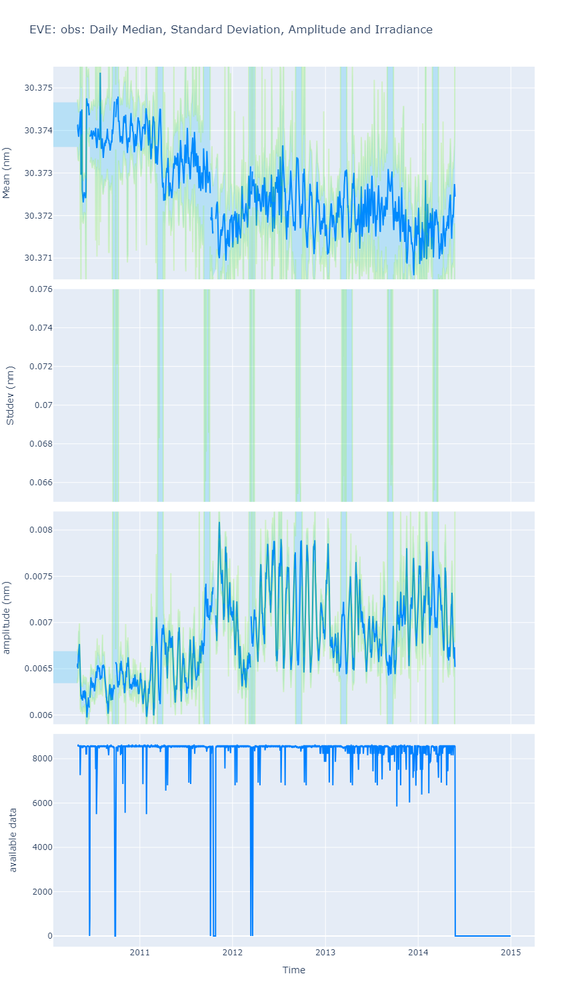

In [5]:
plot(daily_df,None)

In [1]:
import numpy as np

lambda_0=30.38
c=3e9
k=1.38e-23
T=1e5
M= 4*1.67e-24

$$
\sigma^2 = \frac{\lambda^2}{2c^2} ( \frac{2kT_i}{M} + \xi^2)+\sigma_l^2
$$

In [2]:
sigma=np.sqrt(lambda_0**2*k*T/(c**2*M))
sigma

4.6027546642203294e-06

In [14]:
import scipy.constants as const

def calculate_velocity(stddev, wavelength):
    # Constants
    speed_of_light = const.speed_of_light  # Speed of light in m/s
    
    # Calculate the velocity using Doppler formula
    velocity = (stddev / wavelength) * speed_of_light
    
    return velocity


In [15]:
stddev = 0.03e-9  # Replace with your actual standard deviation value
wavelength = 30.38e-9  # Replace with the wavelength of the line in meters

velocity = calculate_velocity(stddev, wavelength)
velocity

296042.58525345626

## one data a day

In [4]:
fit_df

,amplitude,mean,stddev,pcov
time,,,,
2010-04-30 00:00:00,0.006621,30.374182,0.028687,"[[1.909934104783326e-09, 9.230200868174452e-14..."
2010-04-30 00:00:10,0.006623,30.374068,0.028704,"[[2.044234117378633e-09, 9.873151283360399e-14..."
2010-04-30 00:00:20,0.006581,30.374196,0.028695,"[[1.990928537734905e-09, 9.676613666554314e-14..."
2010-04-30 00:00:30,0.006522,30.374199,0.028807,"[[2.2657636938190113e-09, 1.1100608871630828e-..."
2010-04-30 00:00:40,0.006493,30.374291,0.028811,"[[2.02770143185137e-09, 9.9755436572809e-14, -..."
...,...,...,...,...
2014-12-31 22:59:19,NaN,NaN,NaN,"[[nan, nan, nan], [nan, nan, nan], [nan, nan, ..."
2014-12-31 22:59:29,NaN,NaN,NaN,"[[nan, nan, nan], [nan, nan, nan], [nan, nan, ..."
2014-12-31 22:59:39,NaN,NaN,NaN,"[[nan, nan, nan], [nan, nan, nan], [nan, nan, ..."


In [5]:
# df.index = fit_df.index # Convert the index to datetime if it's not already
new_df = fit_df.resample('D').first() 

In [6]:
new_df

,amplitude,mean,stddev,pcov
time,,,,
2010-04-30,0.006621,30.374182,0.028687,"[[1.909934104783326e-09, 9.230200868174452e-14..."
2010-05-01,0.006618,30.374040,0.028956,"[[3.149904214312695e-09, 1.5246421382362166e-1..."
2010-05-02,0.006453,30.373933,0.029093,"[[3.635330161592425e-09, 1.8109759103051555e-1..."
2010-05-03,0.006549,30.374033,0.028972,"[[3.4012200552847684e-09, 1.6629746675578734e-..."
2010-05-04,0.006670,30.373938,0.028963,"[[3.4245054592038228e-09, 1.6456960249322185e-..."
...,...,...,...,...
2014-12-27,NaN,NaN,NaN,"[[nan, nan, nan], [nan, nan, nan], [nan, nan, ..."
2014-12-28,NaN,NaN,NaN,"[[nan, nan, nan], [nan, nan, nan], [nan, nan, ..."
2014-12-29,NaN,NaN,NaN,"[[nan, nan, nan], [nan, nan, nan], [nan, nan, ..."


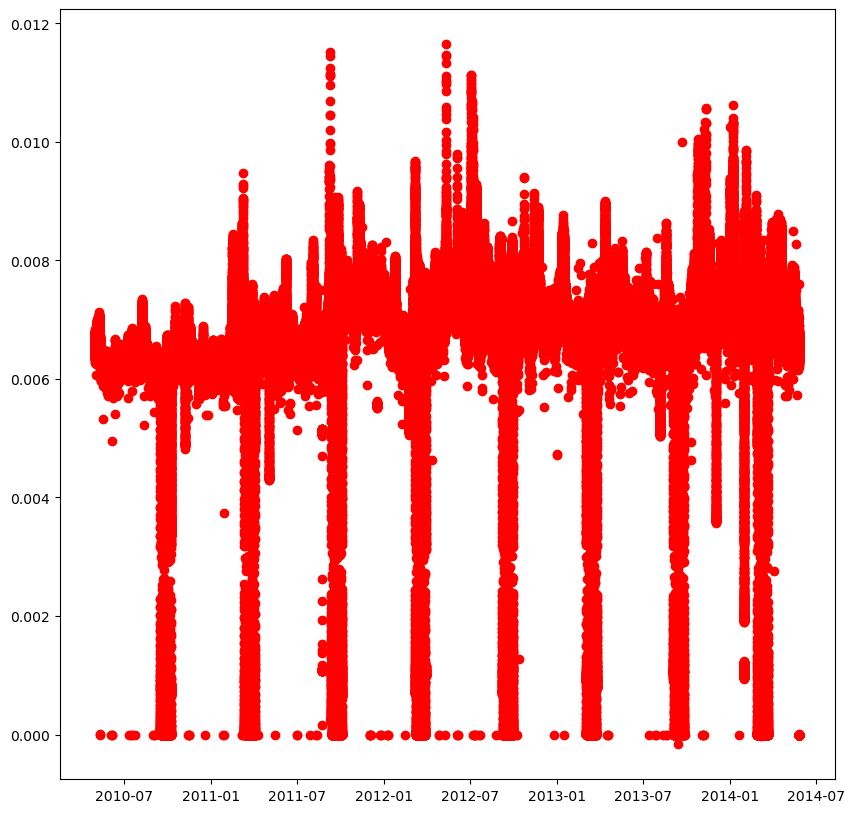

In [11]:
# visualize the new_df using matplotlib
fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(fit_df.index, fit_df['amplitude'], color='red')


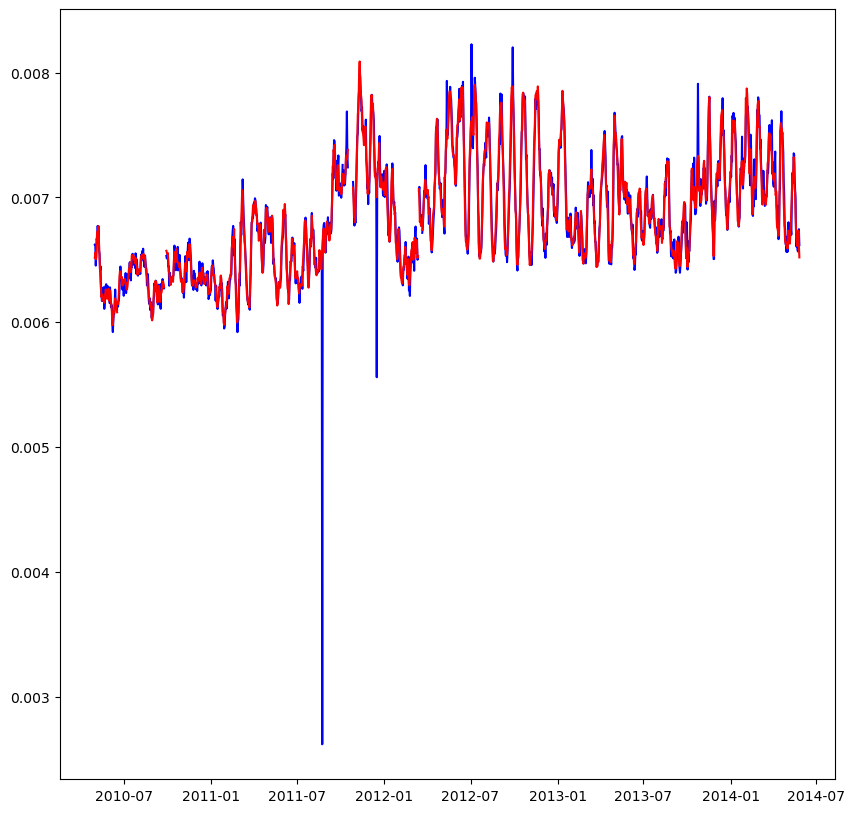

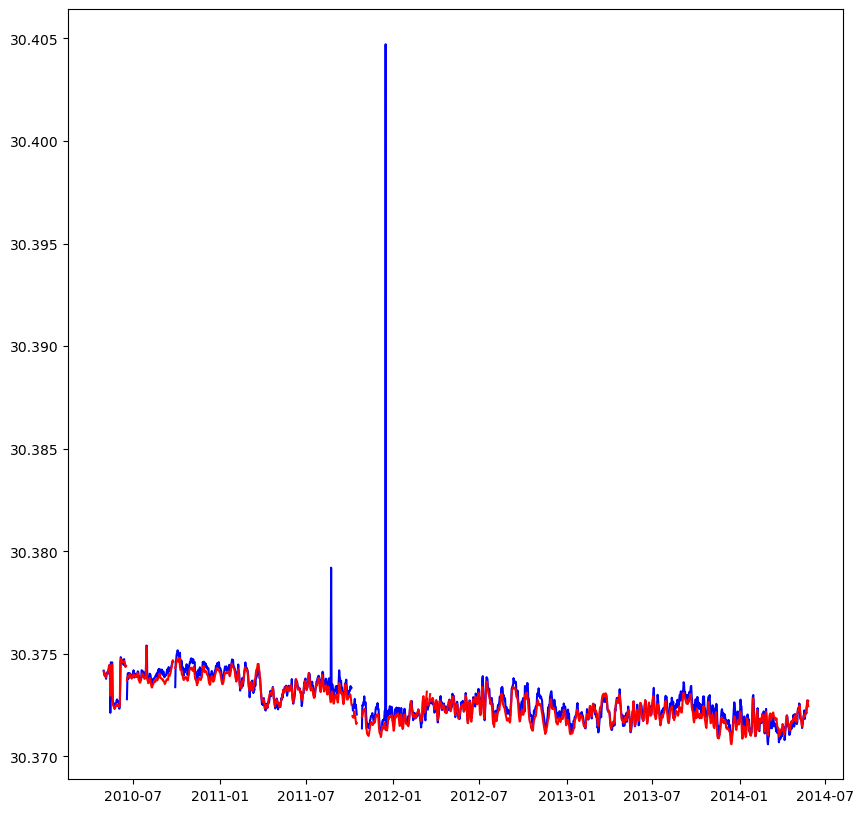

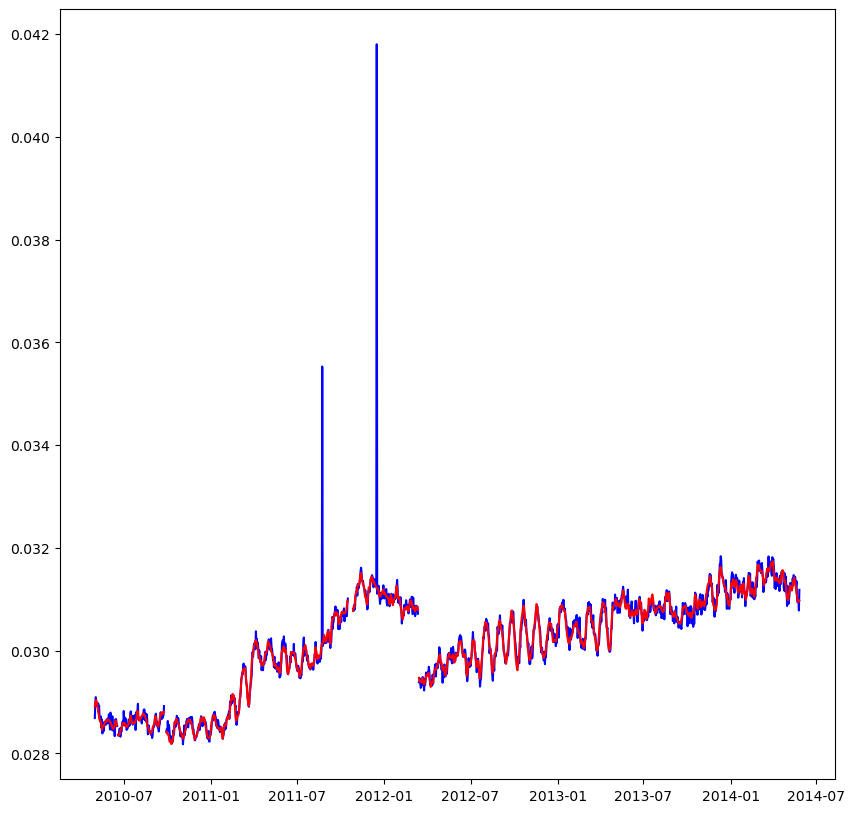

In [22]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.plot(new_df.index, new_df['amplitude'],color='blue', label='first')
ax.plot(daily_df.index, daily_df['median_of_amplitude'], color='red', label='daily')

fig, ax = plt.subplots(figsize=(10, 10))
ax.plot(new_df.index, new_df['mean'],color='blue', label='first')
ax.plot(daily_df.index, daily_df['median_of_mean'], color='red', label='daily')


fig, ax = plt.subplots(figsize=(10, 10))
ax.plot(new_df.index, new_df['stddev'],color='blue', label='first')
ax.plot(daily_df.index, daily_df['median_of_stddev'], color='red', label='daily')


In [18]:
daily_df

,median_of_mean,median_of_stddev,median_of_amplitude,stddev_of_mean,stddev_of_stddev,stddev_of_amplitude,available_data
time,,,,,,,
2010-04-30,30.374138,0.028910,0.006518,0.000175,0.000076,0.000058,8570
2010-05-01,30.374133,0.028986,0.006556,0.000199,0.000070,0.000052,8579
2010-05-02,30.374000,0.029030,0.006503,0.000210,0.000070,0.000048,8579
2010-05-03,30.373922,0.029038,0.006513,0.000206,0.000102,0.000049,8640
2010-05-04,30.373876,0.029006,0.006656,0.000195,0.000092,0.000059,8578
...,...,...,...,...,...,...,...
2014-12-27,NaN,NaN,NaN,NaN,NaN,NaN,0
2014-12-28,NaN,NaN,NaN,NaN,NaN,NaN,0
2014-12-29,NaN,NaN,NaN,NaN,NaN,NaN,0


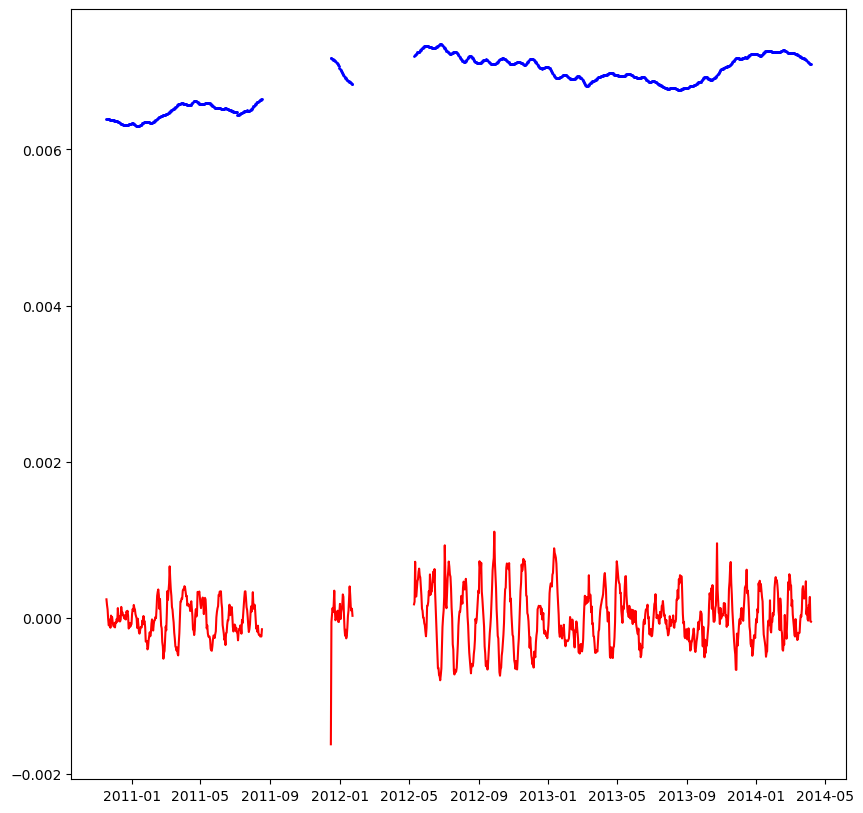

In [38]:
n=100
kernel=np.full((n,),1./n)
smoothed=np.convolve(kernel,new_df['amplitude'],mode='same')

fig,ax=plt.subplots(figsize=(10,10))
ax.scatter(new_df.index,smoothed,s=1,color='blue')
ax.plot(new_df.index,new_df['amplitude']-smoothed,color='red')

In [40]:
new_df.to_csv('daily_df.csv', index=True)

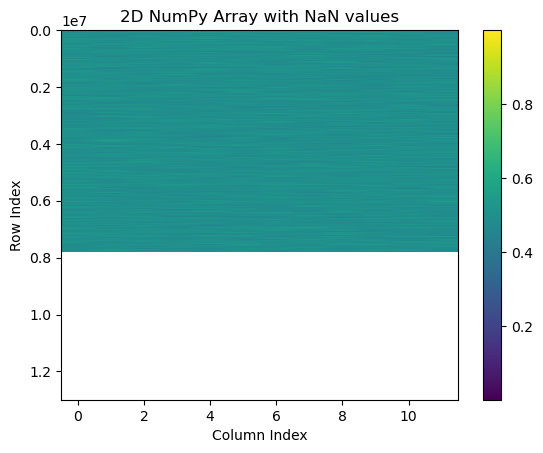

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# Define the dimensions of the array
rows, cols = 12996720, 12

# Create a random array with the specified shape
np.random.seed(42)  # Setting seed for reproducibility
data = np.random.rand(rows, cols)

# Mark the last 20% rows as np.nan
last_40_percent_rows = int(rows * 0.4)
data[-last_40_percent_rows:] = np.nan

# Display the array using imshow
plt.imshow(data, aspect='auto')
plt.colorbar()
plt.title("2D NumPy Array with NaN values")
plt.xlabel("Column Index")
plt.ylabel("Row Index")
plt.show()